In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
#from MulticoreTSNE import MulticoreTSNE as TSNE

In [2]:
wdir = "/mnt/c/Bioinf/SCENIC_fetal"
os.chdir( wdir )

# path to unfiltered loom file (this will be created in the optional steps below)
f_loom_path_unfilt = "pbmc10k_unfiltered.loom" # test dataset, n=500 cells

# # path to loom file with basic filtering applied (this will be created in the "initial filtering" step below). Optional.
f_loom_path_scenic = "FD59_SCENIC.loom"

# path to anndata object, which will be updated to store Scanpy results as they are generated below
f_anndata_path = "anndata.h5ad"

# path to pyscenic output
f_pyscenic_output = "pyscenic_output.loom"

# loom output, generated from a combination of Scanpy and pySCENIC results:
f_final_loom = 'pbmc10k_scenic_integrated-output.loom'

In [3]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(dpi=150, fontsize=10, dpi_save=600)

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                         9.4.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
cffi                        1.15.0
cloudpickle                 2.2.1
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.12.3
dask                        2022.02.0
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
entrypoints                 0.4
fsspec                      2023.1.0
google                      NA
h5py                        3.8.0
igraph                      0.10.8
ipykernel                   6.15.2
ipython_genutils            0.2.0
jedi                        0.18.1
jinja2                      3.1.2
joblib                      1.3.2
jupyter_server              1.23.4
kiwisolver                  1.4.5
leidenalg                   0.10.1
llvmlite                    0.39.

In [4]:
sc.settings.njobs = 32

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

In [8]:
# read unfiltered data from a loom file
adata = sc.read_loom('/mnt/c/Bioinf/SCENIC_fetal/FD59_SCENIC.loom' )

In [9]:
adata

AnnData object with n_obs × n_vars = 2950 × 11933
    obs: 'EK_PB_annov1', 'G2M.Score', 'Phase', 'Retina_Cells', 'S.Score', 'nCount_RNA', 'nFeature_RNA', 'nGene', 'origin', 'percent.mt', 'percent.rb', 'timepoint'

In [10]:
nCountsPerGene = np.sum(adata.X, axis=0)
nCellsPerGene = np.sum(adata.X>0, axis=0)

# Show info
print("Number of counts (in the dataset units) per gene:", nCountsPerGene.min(), " - " ,nCountsPerGene.max())
print("Number of cells in which each gene is detected:", nCellsPerGene.min(), " - " ,nCellsPerGene.max())

Number of counts (in the dataset units) per gene: 29.506693  -  16650.955
Number of cells in which each gene is detected: 11  -  2950


In [11]:
nCells=adata.X.shape[0]

# pySCENIC thresholds
minCountsPerGene=3*.01*nCells # 3 counts in 1% of cells
print("minCountsPerGene: ", minCountsPerGene)

minSamples=.01*nCells # 1% of cells
print("minSamples: ", minSamples)

minCountsPerGene:  88.5
minSamples:  29.5


In [12]:
# simply compute the number of genes per cell (computers 'n_genes' column)
sc.pp.filter_cells(adata, min_genes=0)
# mito and genes/counts cuts
mito_genes = adata.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  
/home/mcrewcow/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  if __name__ == "__main__":
/home/mcrewcow/anaconda3/lib/python3.7/site-pa

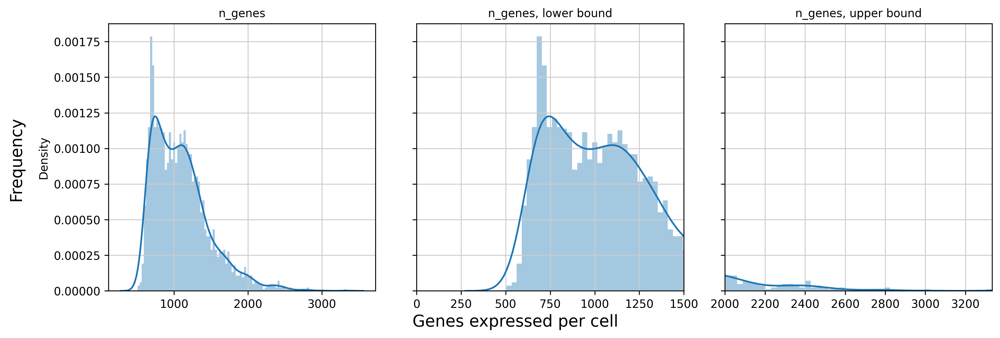

In [13]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=True)

x = adata.obs['n_genes']
x_lowerbound = 1500
x_upperbound = 2000
nbins=100

sns.distplot(x, ax=ax1, norm_hist=True, bins=nbins)
sns.distplot(x, ax=ax2, norm_hist=True, bins=nbins)
sns.distplot(x, ax=ax3, norm_hist=True, bins=nbins)

ax2.set_xlim(0,x_lowerbound)
ax3.set_xlim(x_upperbound, adata.obs['n_genes'].max() )

for ax in (ax1,ax2,ax3): 
  ax.set_xlabel('')

ax1.title.set_text('n_genes')
ax2.title.set_text('n_genes, lower bound')
ax3.title.set_text('n_genes, upper bound')

fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')
fig.text(0.5, 0.0, 'Genes expressed per cell', ha='center', va='center', size='x-large')

fig.tight_layout()

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  
/home/mcrewcow/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  if __name__ == "__main__":
/home/mcrewcow/anaconda3/lib/python3.7/site-pa

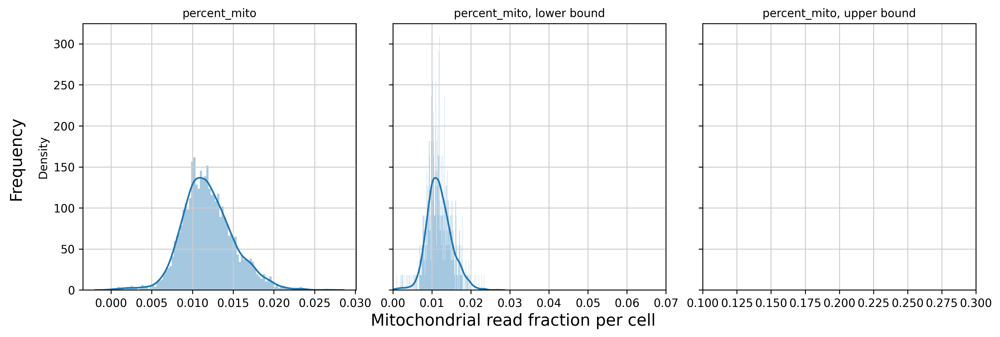

In [14]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=True)

x = adata.obs['percent_mito']
x_lowerbound = [0.0, 0.07 ]
x_upperbound = [ 0.10, 0.3 ]
nbins=100

sns.distplot(x, ax=ax1, norm_hist=True, bins=nbins)
sns.distplot(x, ax=ax2, norm_hist=True, bins=int(nbins/(x_lowerbound[1]-x_lowerbound[0])) )
sns.distplot(x, ax=ax3, norm_hist=True, bins=int(nbins/(x_upperbound[1]-x_upperbound[0])) )

ax2.set_xlim(x_lowerbound[0], x_lowerbound[1])
ax3.set_xlim(x_upperbound[0], x_upperbound[1] )
for ax in (ax1,ax2,ax3): 
  ax.set_xlabel('')

ax1.title.set_text('percent_mito')
ax2.title.set_text('percent_mito, lower bound')
ax3.title.set_text('percent_mito, upper bound')

fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')
fig.text(0.5, 0.0, 'Mitochondrial read fraction per cell', ha='center', va='center', size='x-large')

fig.tight_layout()

In [15]:
adata

AnnData object with n_obs × n_vars = 2950 × 11933
    obs: 'EK_PB_annov1', 'G2M.Score', 'Phase', 'Retina_Cells', 'S.Score', 'nCount_RNA', 'nFeature_RNA', 'nGene', 'origin', 'percent.mt', 'percent.rb', 'timepoint', 'n_genes', 'percent_mito', 'n_counts'

computing PCA
    with n_comps=50
    finished (0:00:03)


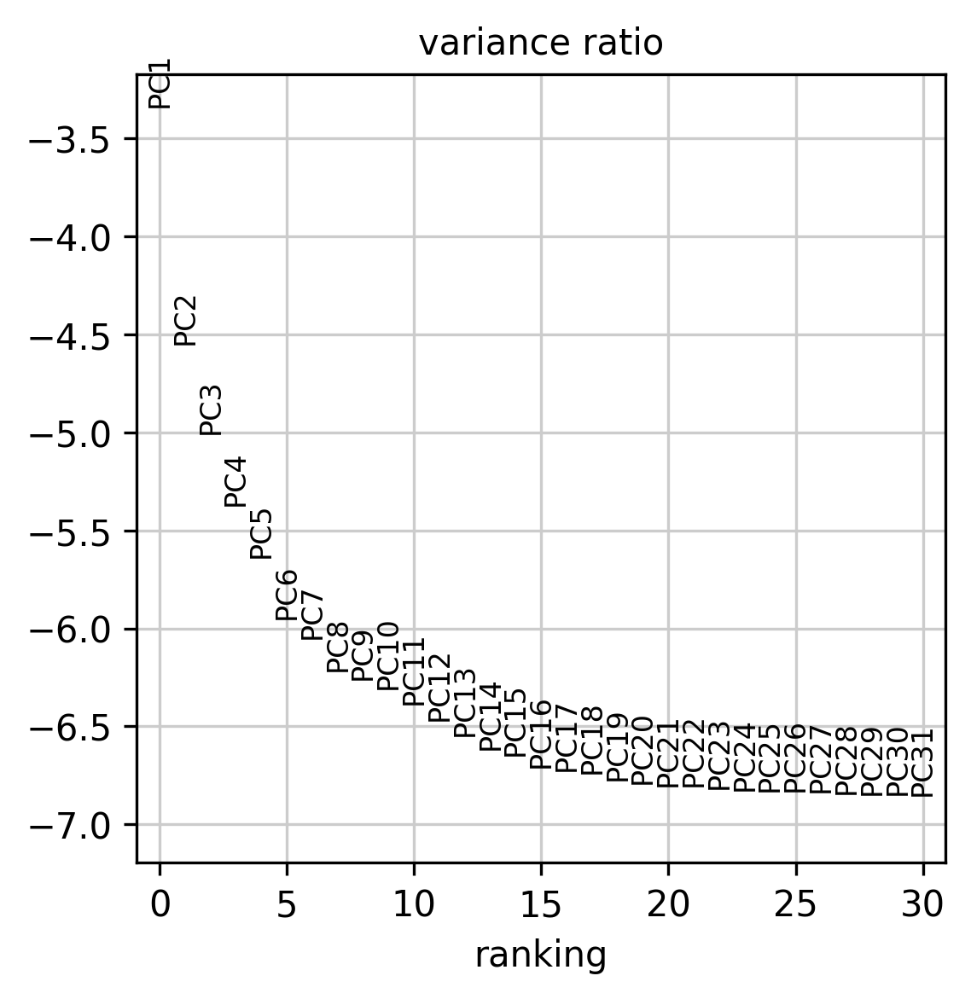

In [16]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)
adata.write( f_anndata_path )

In [18]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=30)
# compute UMAP
sc.tl.umap(adata)

adata.write( f_anndata_path )

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


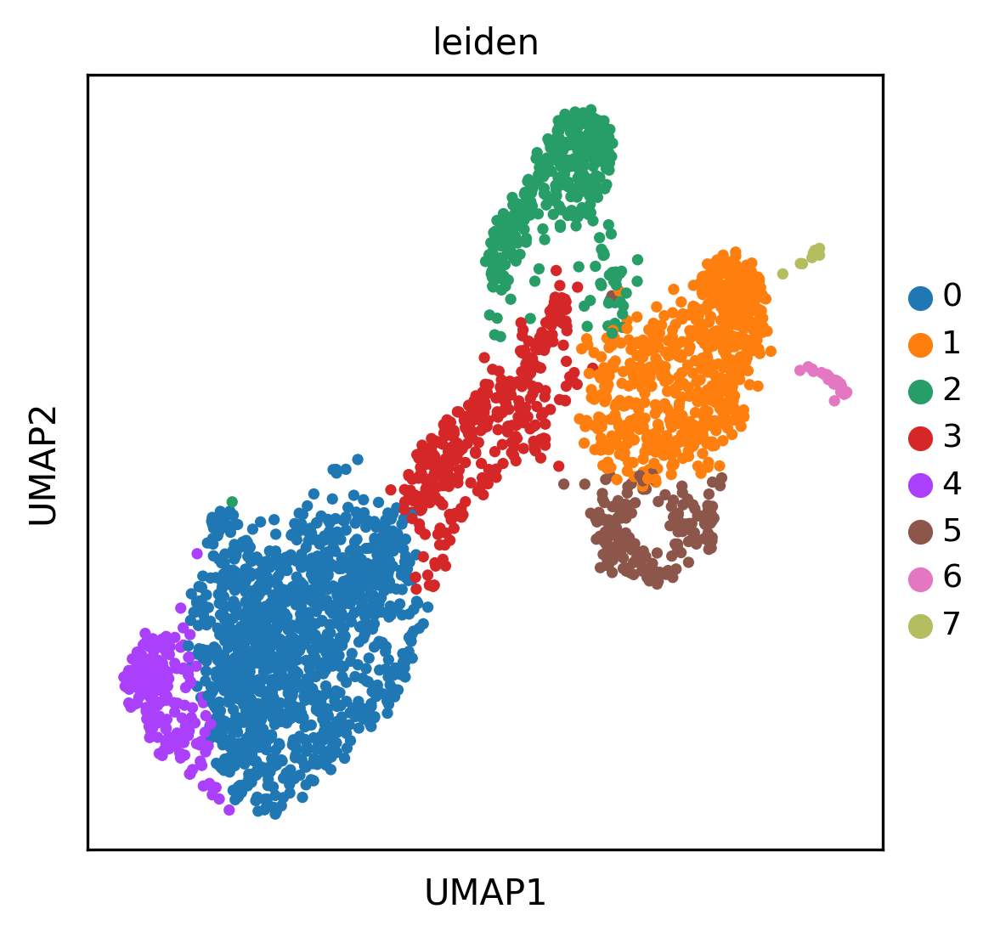

In [20]:
sc.tl.leiden(adata,resolution=0.4)

sc.pl.umap(adata, color=['leiden'] )

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


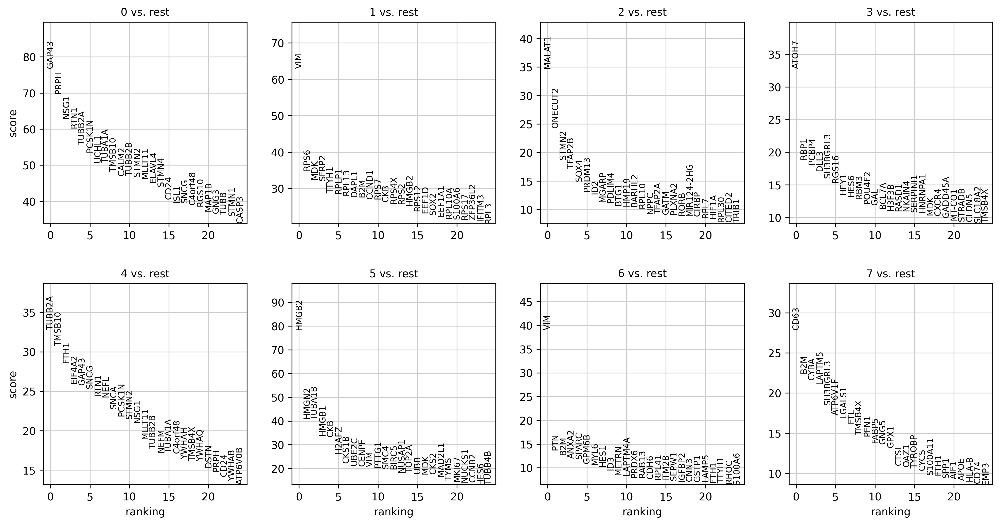

In [21]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# sc.tl.rank_genes_groups(adata, 'louvain', method='logreg')
# sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)
adata.write( f_anndata_path )

In [6]:
f_tfs = "/mnt/c/Bioinf/SCENIC_fetal/allTFs_hg38.txt"

In [4]:
!pyscenic grn {f_loom_path_scenic} {f_tfs} -o adj.csv --num_workers 20


2024-04-17 12:06:42,678 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2024-04-17 12:06:57,494 - pyscenic.cli.pyscenic - INFO - Inferring regulatory networks.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork fro

In [7]:
!arboreto_with_multiprocessing.py {f_loom_path_scenic} {f_tfs} --method grnboost2 --output adj.tsv --num_workers 32 --seed 777

Loaded expression matrix of 2950 cells and 11933 genes in 7.5238237380981445 seconds...
Loaded 1797 TFs...
starting grnboost2 using 32 processes...
100%|███████████████████████████████████| 11933/11933 [1:37:41<00:00,  2.04it/s]
Done in 5865.105188369751 seconds.


In [7]:
adjacencies = pd.read_csv("adj.tsv", index_col=False, sep='\t')

In [8]:
adjacencies.head()

,TF,target,importance
0,ISL1,GAP43,118.097496
1,HMGB2,PTTG1,117.994458
2,HMGB2,CENPF,115.703361
3,ISL1,NSG1,115.160864
4,ISL1,PRPH,105.126891


In [9]:
import glob
# ranking databases
f_db_glob = "/mnt/c/Bioinf/SCENIC_fetal/*feather"
f_db_names = ' '.join( glob.glob(f_db_glob) )

# motif databases
f_motif_path = "/mnt/c/Bioinf/SCENIC_fetal/motifs-v10nr_clust-nr.hgnc-m0.001-o0.0.tbl"

In [11]:
!pyscenic ctx adj.tsv \
    {f_db_names} \
    --annotations_fname {f_motif_path} \
    --expression_mtx_fname {f_loom_path_scenic} \
    --output reg.csv \
    --mask_dropouts \
    --num_workers 8


2024-04-17 22:24:52,509 - pyscenic.cli.pyscenic - INFO - Creating modules.

2024-04-17 22:24:53,117 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2024-04-17 22:25:00,028 - pyscenic.utils - INFO - Calculating Pearson correlations.

2024-04-17 22:25:00,143 - pyscenic.utils - WARNING - Note on correlation calculation: the default behaviour for calculating the correlations has changed after pySCENIC verion 0.9.16. Previously, the default was to calculate the correlation between a TF and target gene using only cells with non-zero expression values (mask_dropouts=True). The current default is now to use all cells to match the behavior of the R verision of SCENIC. The original settings can be retained by setting 'rho_mask_dropouts=True' in the modules_from_adjacencies function, or '--mask_dropouts' from the CLI.
	Dropout masking is currently set to [True].

2024-04-17 22:25:03,508 - pyscenic.utils - INFO - Creating modules.

2024-04-17 22:25:46,967 - pyscenic.cli.pyscenic - IN

In [12]:
adata = sc.read_h5ad('/mnt/c/Bioinf/SCENIC_fetal/anndata.h5ad' )

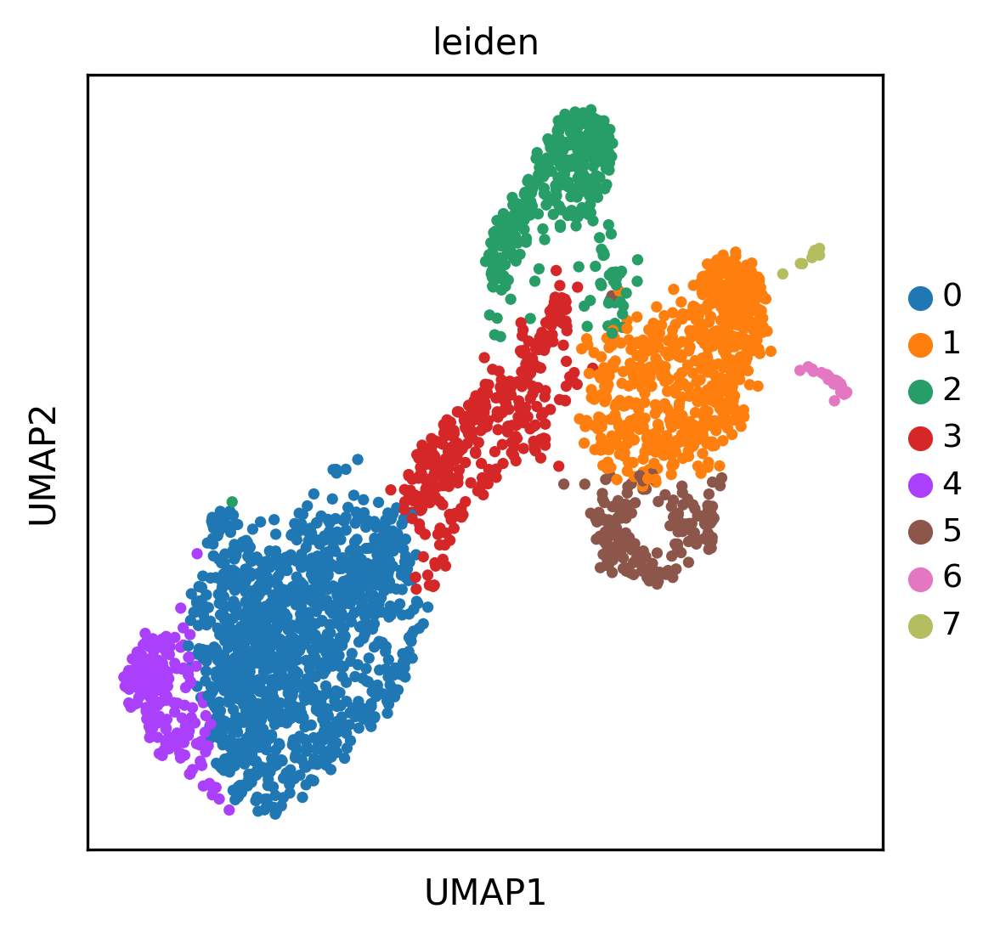

In [13]:
sc.pl.umap(adata, color=['leiden'] )

In [16]:
import numpy as np
import pandas as pd

In [19]:
nGenesDetectedPerCellbefore = np.sum(adata.X>0, axis=1)
a = np.reshape(nGenesDetectedPerCellbefore,2950)
a = a.A
a = np.reshape(a,2950)
a = pd.Series(a)
percentiles = a.quantile([0.01, 0.05, 0.10, 0.50, 1])
print(percentiles)

0.01     598.00
0.05     645.45
0.10     684.00
0.50    1040.50
1.00    3333.00
dtype: float64


/home/mcrewcow/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  


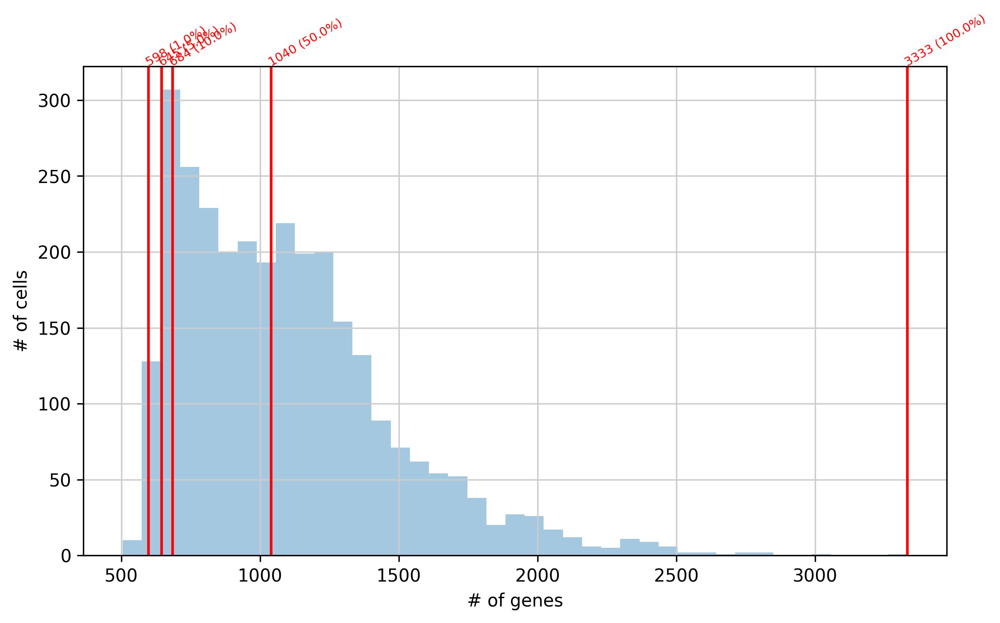

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5), dpi=150)
sns.distplot(nGenesDetectedPerCell, norm_hist=False, kde=False, bins='fd')
for i,x in enumerate(percentiles):
    fig.gca().axvline(x=x, ymin=0,ymax=1, color='red')
    ax.text(x=x, y=ax.get_ylim()[1], s=f'{int(x)} ({percentiles.index.values[i]*100}%)', color='red', rotation=30, size='x-small',rotation_mode='anchor' )
ax.set_xlabel('# of genes')
ax.set_ylabel('# of cells')
fig.tight_layout()

In [21]:
!pyscenic aucell \
    {f_loom_path_scenic} \
    reg.csv \
    --output {f_pyscenic_output} \
    --num_workers 8


2024-04-17 22:41:39,205 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2024-04-17 22:41:46,855 - pyscenic.cli.pyscenic - INFO - Loading gene signatures.
Create regulons from a dataframe of enriched features.
Additional columns saved: []

2024-04-17 22:41:47,056 - pyscenic.cli.pyscenic - INFO - Calculating cellular enrichment.

2024-04-17 22:41:50,134 - pyscenic.cli.pyscenic - INFO - Writing results to file.


In [22]:
import json
import zlib
import base64

# collect SCENIC AUCell output
lf = lp.connect( f_pyscenic_output, mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
lf.close()

In [24]:
import umap

# UMAP
runUmap = umap.UMAP(n_neighbors=10, min_dist=0.4, metric='correlation').fit_transform
dr_umap = runUmap( auc_mtx )
pd.DataFrame(dr_umap, columns=['X', 'Y'], index=auc_mtx.index).to_csv( "scenic_umap.txt", sep='\t')

In [25]:
# scenic output
lf = lp.connect( f_pyscenic_output, mode='r+', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
#exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID)
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons
dr_umap = pd.read_csv( 'scenic_umap.txt', sep='\t', header=0, index_col=0 )
###

In [26]:
auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
# regulon thresholds
rt = meta['regulonThresholds']
for i,x in enumerate(rt):
    tmp = x.get('regulon').replace("(","_(")
    x.update( {'regulon': tmp} )

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [27]:
Embeddings_X = pd.DataFrame( index=lf.ca.CellID )
Embeddings_X = pd.concat( [
        pd.DataFrame(adata.obsm['X_umap'],index=adata.obs.index)[0] ,
        pd.DataFrame(adata.obsm['X_pca'],index=adata.obs.index)[0] ,
        dr_umap['X']
    ], sort=False, axis=1, join='outer' )
Embeddings_X.columns = ['1','2','3']

Embeddings_Y = pd.DataFrame( index=lf.ca.CellID )
Embeddings_Y = pd.concat( [
        pd.DataFrame(adata.obsm['X_umap'],index=adata.obs.index)[1] ,
        pd.DataFrame(adata.obsm['X_pca'],index=adata.obs.index)[1] ,
        dr_umap['Y']
    ], sort=False, axis=1, join='outer' )
Embeddings_Y.columns = ['1','2','3']

In [70]:
metaJson = {}

metaJson['embeddings'] = [
    {
        "id": 1,
        "name": f"Scanpy UMAP  (highly variable genes)"
    },
    {
        "id": 2,
        "name": "Scanpy PC1/PC2"
    },
    {
        "id": 3,
        "name": "SCENIC AUC t-SNE"
    },
    {
        "id": 4,
        "name": "SCENIC AUC UMAP"
    },
]

metaJson["clusterings"] = [{
            "id": 0,
            "group": "Scanpy",
            "name": "Scanpy leiden default resolution",
            "clusters": [],
        }]

metaJson["metrics"] = [
        {
            "name": "nUMI"
        }, {
            "name": "nGene"
        }, {
            "name": "Percent_mito"
        }
]

metaJson["annotations"] = [
    {
        "name": "Leiden_clusters_Scanpy",
        "values": list(set( adata.obs['leiden'].astype(np.str) ))
    },
    #{
        #"name": "Cell type",
        #"values": list(set(adata.obs['EK_PB_annov1'].values))
    #},
    #{
    #    "name": "Timepoint",
    #    "values": list(set(adata.obs['Timepoint'].values))
    #},
    #{
    #    "name": "Sample",
    #    "values": list(set(adata.obs['Sample'].values))
    #}
]

# SCENIC regulon thresholds:
metaJson["regulonThresholds"] = rt

for i in range(max(set([int(x) for x in adata.obs['leiden']])) + 1):
    clustDict = {}
    clustDict['id'] = i
    clustDict['description'] = f'Unannotated Cluster {i + 1}'
    metaJson['clusterings'][0]['clusters'].append(clustDict)
    
clusterings = pd.DataFrame()
clusterings["0"] = adata.obs['leiden'].values.astype(np.int64)

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


In [29]:
adata.obs

,EK_PB_annov1,G2M.Score,Phase,Retina_Cells,S.Score,nCount_RNA,nFeature_RNA,nGene,origin,percent.mt,percent.rb,timepoint,n_genes,percent_mito,n_counts,leiden
CellID,,,,,,,,,,,,,,,,
AAACATACGAGGCA-1_15,7,0.273759,G2M,2,0.194739,1976.0,1042,1031,Thomas Reh Lab,1.012146,27.277328,Day 59,1031,0.008233,2140.482422,1
AAACATACTTTCAC-1_15,3,-0.137892,G1,2,-0.102535,1735.0,918,909,Thomas Reh Lab,1.152738,24.034582,Day 59,909,0.008772,2006.252686,3
AAACATTGACCTGA-1_15,3,-0.222697,G1,2,-0.182406,2323.0,1140,1131,Thomas Reh Lab,0.516573,22.987516,Day 59,1131,0.005791,2266.998535,0
AAACCGTGAGAACA-1_15,4,-0.190340,G1,2,-0.065979,2751.0,1214,1187,Thomas Reh Lab,1.999273,29.989095,Day 59,1187,0.011768,2223.166016,6
AAACCGTGATACCG-1_15,5,-0.118872,G1,2,-0.095025,1360.0,711,701,Thomas Reh Lab,3.529412,30.147059,Day 59,701,0.018882,1703.899902,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGGGGAGT-1_15,4,-0.114401,G1,2,-0.064985,1464.0,668,661,Thomas Reh Lab,2.322404,39.959016,Day 59,661,0.014663,1586.584106,1
TTTGACTGTGGTAC-1_15,3,-0.213258,G1,2,-0.192374,2190.0,1104,1094,Thomas Reh Lab,1.826484,21.232877,Day 59,1094,0.012439,2229.561035,0
TTTGCATGAATCGC-1_15,5,-0.130297,G1,2,-0.115540,1405.0,730,729,Thomas Reh Lab,0.854093,24.270463,Day 59,729,0.007969,1760.711304,0


In [71]:
def dfToNamedMatrix(df):
    arr_ip = [tuple(i) for i in df.values]
    dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
    arr = np.array(arr_ip, dtype=dtyp)
    return arr

In [72]:
col_attrs = {
    "CellID": np.array(adata.obs.index),
    "nUMI": np.array(adata.obs['n_counts'].values),
    "nGene": np.array(adata.obs['n_genes'].values),
    "Leiden_clusters_Scanpy": np.array( adata.obs['leiden'].values),
    #"Cell type": np.array(adata.obs['EK_PB_annov1'].values),
    #"Timepoint": np.array(adata.obs['Timepoint'].values),
    #"Sample": np.array(adata.obs['Sample'].values),
    "Percent_mito": np.array(adata.obs['percent_mito'].values),
    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
    "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
    "RegulonsAUC": dfToNamedMatrix(auc_mtx),
    "Clusterings": dfToNamedMatrix(clusterings),
    "ClusterID": np.array(adata.obs['leiden'].values)
}

row_attrs = {
    "Gene": lf.ra.Gene,
    "Regulons": regulons,
}

attrs = {
    "title": "sampleTitle",
    "MetaData": json.dumps(metaJson),
    "Genome": 'hg38',
    "SCopeTreeL1": "",
    "SCopeTreeL2": "",
    "SCopeTreeL3": ""
}

# compress the metadata field:
attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')

In [69]:
np.array(adata.obs['leiden'].values)

array(['1', '3', '0', ..., '0', '5', '3'], dtype=object)

In [50]:
metaJson

{'embeddings': [{'id': 1, 'name': 'Scanpy UMAP  (highly variable genes)'},
  {'id': 2, 'name': 'Scanpy PC1/PC2'},
  {'id': 3, 'name': 'SCENIC AUC t-SNE'},
  {'id': 4, 'name': 'SCENIC AUC UMAP'}],
 'clusterings': [{'id': 0,
   'group': 'Scanpy',
   'name': 'Scanpy leiden default resolution',
   'clusters': [{'id': 0, 'description': 'Unannotated Cluster 1'},
    {'id': 1, 'description': 'Unannotated Cluster 2'},
    {'id': 2, 'description': 'Unannotated Cluster 3'},
    {'id': 3, 'description': 'Unannotated Cluster 4'},
    {'id': 4, 'description': 'Unannotated Cluster 5'},
    {'id': 5, 'description': 'Unannotated Cluster 6'},
    {'id': 6, 'description': 'Unannotated Cluster 7'},
    {'id': 7, 'description': 'Unannotated Cluster 8'}]}],
 'metrics': [{'name': 'nUMI'}, {'name': 'nGene'}, {'name': 'Percent_mito'}],
 'annotations': [{'name': 'Leiden_clusters_Scanpy',
   'values': ['4', '6', '3', '1', '7', '2', '0', '5']},
  {'name': 'Cell type', 'values': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11

In [73]:
lp.create(
    filename = f_final_loom ,
    layers=lf[:,:],
    row_attrs=row_attrs, 
    col_attrs=col_attrs,
    file_attrs=attrs
)
lf.close()

In [76]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

In [77]:
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [78]:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [82]:
cellAnnot = pd.concat(
    [
        
        pd.DataFrame( lf.ca.ClusterID, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Leiden_clusters_Scanpy, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Percent_mito, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nGene, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nUMI, index=lf.ca.CellID ),
    ],
    axis=1
)
cellAnnot.columns = [
 'ClusterID',
 'Louvain_clusters_Scanpy',
 'Percent_mito',
 'nGene',
 'nUMI']

In [81]:
lf

,,CellID,AAACATACGAGGCA-1_15,AAACATACTTTCAC-1_15,AAACATTGACCTGA-1_15,AAACCGTGAGAACA-1_15,AAACCGTGATACCG-1_15,AAACGCACCCGTAA-1_15,AAACGCACGAGGAC-1_15,AAACGCTGACCAAC-1_15,AAACGCTGCCTCAC-1_15,AAACGCTGGATGAA-1_15,...
,,ClusterID,1,3,0,6,2,0,0,2,0,4,...
,,Clusterings,"(1,)","(3,)","(0,)","(6,)","(2,)","(0,)","(0,)","(2,)","(0,)","(4,)",...
,,Embeddings_X,"(13.03168, 13.3624325, 5.526564)","(5.7529182, -1.2814807, 10.814465)","(4.482319, -6.7620406, 10.880359)","(16.405159, 5.870308, 3.9523637)","(10.245765, 2.037589, 10.789884)","(1.7910041, -12.184416, 13.621711)","(1.6382877, -12.1719055, 14.728677)","(10.397859, 3.7585118, 8.30264)","(1.5782189, -9.724077, 13.300308)","(-1.9099348, -9.788103, 12.335948)",...
,,Embeddings_Y,"(1.7024789, 3.8261244, 3.3182642)","(0.18408069, -1.5637758, 4.296547)","(-1.0568367, 1.5800252, 4.371488)","(2.692881, 2.9036703, 2.7204394)","(7.636855, -8.514656, 1.7468755)","(-3.8790748, 2.4861724, 2.1283498)","(-4.312532, 2.5174446, 2.0322957)","(7.212077, -10.397143, 3.5372658)","(-2.6428578, -1.0649344, 2.3826566)","(-2.8997395, -3.6434202, 2.5263598)",...
,,Leiden_clusters_Scanpy,1,3,0,6,2,0,0,2,0,4,...
,,Percent_mito,0.00823342,0.00877183,0.0057911687,0.011767732,0.018882388,0.011367271,0.012317027,0.014787319,0.013744165,0.010537124,...
,,RegulonsAUC,"(0., 0.00457286, 0., 0.01275609, 0.10217755, 0.04337929, 0.0309373, 0., 0.02586423, 0.03239361, 0.02560421, 0.04582436, 0.02184438, 0., 0.01770759, 0., 0.07040019, 0.03187814, 0.00860785, 0.02189962, 0.03154269, 0.12153359, 0.03386429, 0.11834535, 0.0131459, 0.02229667, 0.02622307, 0., 0.01030469, 0., 0.02031434, 0.0226321, 0.0123344, 0.02657226, 0., 0.02932857, 0.02026801, 0.02371859, 0.02987158, 0.05152429, 0., 0.01680843, 0.03852596, 0.01359974, 0.00537409, 0.02400893, 0.0279655, 0., 0., 0.13413559, 0.0116969, 0., 0., 0.02390742, 0.03591729, 0., 0., 0.00502513, 0.03194075, 0.03207831, 0.03199672, 0.03510888, 0.01737856, 0., 0., 0., 0.02629031, 0., 0., 0., 0., 0., 0.0292147, 0.0831609, 0., 0., 0., 0.08889687, 0., 0.01884422, 0.00785981, 0., 0., 0., 0.01298764, 0., 0.02025278, 0., 0.04221106, 0.10251256, 0.05223085, 0.00186832, 0.05911017, 0., 0., 0., 0., 0.02275265, 0.0555755, 0., 0.02467895, 0.03529553, 0.04731993, 0.15362527, 0.10794552, 0.03439818, 0., 0.02000914, 0.16207705, 0.01114098, 0.01522765, 0., 0.01104287, 0.0198995, 0., 0.01677085, 0.04230411, 0.0110473, 0.0568522, 0.01532663, 0.02747069, 0.04145729, 0.02851294, 0.03852596, 0.01188739, 0.03722315, 0., 0.0185148, 0.07634665, 0.0342502, 0., 0., 0., 0., 0.1218569, 0.11232352, 0., 0., 0.05212933, 0., 0.03204083, 0., 0.01970168, 0., 0., 0., 0.08107203, 0., 0.02111614, 0., 0., 0.0580935, 0.05343384, 0.01663875, 0., 0., 0.0321515, 0., 0., 0.00628141, 0., 0., 0.07677275, 0., 0., 0., 0., 0.03084869, 0., 0., 0., 0., 0.15963149, 0., 0.01795717, 0., 0.02601242)","(0., 0.00685092, 0., 0.00286046, 0.14328051, 0.00910536, 0.03650135, 0.11323283, 0.01565571, 0.01078841, 0.02295119, 0., 0.01996283, 0., 0.0109476, 0., 0.04099211, 0.0073981, 0.01474967, 0., 0.04326798, 0.11049073, 0.03076704, 0.0876848, 0.01972945, 0., 0.03113267, 0., 0., 0., 0.01079867, 0.02050023, 0., 0.01162378, 0., 0.03178285, 0.03082077, 0.01943049, 0., 0.039866, 0.01088777, 0.01118145, 0.02724735, 0.02711973, 0., 0.00781686, 0.03775583, 0., 0., 0.16944371, 0.00746671, 0.03430486, 0., 0., 0.01984421, 0.04501675, 0., 0.16454065, 0.02941998, 0.03488127, 0.03162069, 0.07524288, 0., 0., 0., 0., 0.01710375, 0.01515329, 0.08458961, 0., 0.04234134, 0., 0.01803133, 0.05182777, 0., 0., 0., 0., 0., 0.00160525, 0., 0.02419505, 0., 0.03136051, 0.03381643, 0.05125628, 0.19932998, 0., 0., 0., 0., 0.00592707, 0.06926791, 0., 0., 0., 0., 0.01684348, 0.03206509, 0., 0.03953099, 0.02476669, 0.0306742, 0.04606365, 0.04675552, 0.04133764, 0., 0.01350693, 0., 0., 0., 0., 0., 0.01742044, 0., 0.03958818, 0.05635585, 0.00506501, 0.06368859, 0., 0.03776023, 0.00762144, 0.01142751, 0., 0., 0.07286432, 0., 0.00444444, 0.00960945, 0.03892268, 0.12730318, 0., 0.

In [84]:
dr = [
]
dr_names = [
    meta['embeddings'][0]['name'].replace(" ","_")
]

# add other embeddings
drx = pd.DataFrame( lf.ca.Embeddings_X, index=lf.ca.CellID )
dry = pd.DataFrame( lf.ca.Embeddings_Y, index=lf.ca.CellID )

for i in range( len(drx.columns) ):
    dr.append( pd.concat( [ drx.iloc[:,i], dry.iloc[:,i] ], sort=False, axis=1, join='outer' ))
    dr_names.append( meta['embeddings'][i+1]['name'].replace(" ","_").replace('/','-') )

# rename columns:
for i,x in enumerate( dr ):
    x.columns = ['X','Y']

In [85]:
lf.close()

In [86]:
from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [87]:
df_motifs = load_motifs('reg.csv')

In [90]:
selected_motifs = ['PAX6','TCF3','EBF1']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]

In [91]:
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

In [94]:
sc.set_figure_params(frameon=False, dpi=600, fontsize=10, dpi_save=600)

sc.pl.scatter( adata, basis='highly_variable_genes_UMAP', 
    color=['Leiden_clusters_Scanpy'],
    title=['HVG - UMAP (Louvain clusters)'],
    alpha=0.8,
    #save='_Leiden-celltype.pdf'
    )

sc.pl.scatter( adata, basis='SCENIC_AUC_UMAP', 
    color=['Leiden_clusters_Scanpy'],
    title=['SCENIC - UMAP (Leiden clusters)'], 
    alpha=0.8,
    #save='_Leiden-celltype.pdf'
    )

KeyError: 'compute coordinates using visualization tool SCENIC_AUC_UMAP first'

In [95]:
adata

AnnData object with n_obs × n_vars = 2950 × 11933
    obs: 'EK_PB_annov1', 'G2M.Score', 'Phase', 'Retina_Cells', 'S.Score', 'nCount_RNA', 'nFeature_RNA', 'nGene', 'origin', 'percent.mt', 'percent.rb', 'timepoint', 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    uns: 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [96]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    #
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():  
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

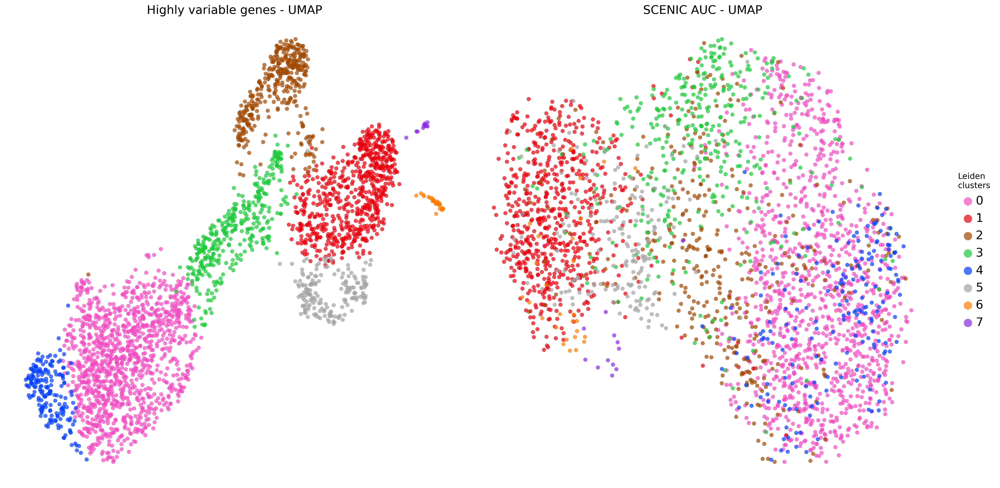

In [113]:
plt.rcParams.update({'font.size':12})

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(20,10), dpi=150 )

drplot( dr[0], colorlab=cellAnnot['Louvain_clusters_Scanpy'], ax=ax1, palette='bright', s=2, title='Highly variable genes - UMAP' )

drplot( dr[2], colorlab=cellAnnot['Louvain_clusters_Scanpy'], ax=ax2, palette='bright', s=2, title='SCENIC AUC - UMAP' )
ax2.legend(loc='right', bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize='x-large', frameon=False, title="Leiden\nclusters")

plt.tight_layout()
plt.savefig("PBMC10k_dimred_umap-hvg-scenic-leiden.pdf", dpi=600, bbox_inches = "tight")

In [104]:
dr

[                             X         Y
 AAACATACGAGGCA-1_15  13.031680  1.702479
 AAACATACTTTCAC-1_15   5.752918  0.184081
 AAACATTGACCTGA-1_15   4.482319 -1.056837
 AAACCGTGAGAACA-1_15  16.405159  2.692881
 AAACCGTGATACCG-1_15  10.245765  7.636855
 ...                        ...       ...
 TTTGACTGGGGAGT-1_15  14.026235  3.935257
 TTTGACTGTGGTAC-1_15   4.541403 -1.603924
 TTTGCATGAATCGC-1_15   1.940069 -0.922095
 TTTGCATGATTGGC-1_15  13.179765 -0.118933
 TTTGCATGGGACAG-1_15   6.484395  1.393443
 
 [2950 rows x 2 columns],
                              X         Y
 AAACATACGAGGCA-1_15  13.362432  3.826124
 AAACATACTTTCAC-1_15  -1.281481 -1.563776
 AAACATTGACCTGA-1_15  -6.762041  1.580025
 AAACCGTGAGAACA-1_15   5.870308  2.903670
 AAACCGTGATACCG-1_15   2.037589 -8.514656
 ...                        ...       ...
 TTTGACTGGGGAGT-1_15  12.108220 -4.852713
 TTTGACTGTGGTAC-1_15  -6.852175  0.360677
 TTTGCATGAATCGC-1_15  -4.068228 -4.812566
 TTTGCATGATTGGC-1_15  14.276719  5.450456
 TTTGC

In [107]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

In [114]:
rss_cellType = regulon_specificity_scores( auc_mtx, cellAnnot['Louvain_clusters_Scanpy'] )
rss_cellType

,AEBP2_(+),ARID3A_(+),ATF2_(+),ATF3_(+),ATF4_(+),ATF6_(+),BCLAF1_(+),BPTF_(+),CEBPB_(+),CEBPG_(+),...,ZNF641_(+),ZNF654_(+),ZNF699_(+),ZNF711_(+),ZNF740_(+),ZNF77_(+),ZNF770_(+),ZNF837_(+),ZSCAN18_(+),ZSCAN2_(+)
1,0.225070,0.374913,0.265332,0.372249,0.318008,0.364100,0.366195,0.338363,0.408192,0.363482,...,0.289702,0.177834,0.235412,0.268369,0.280991,0.370895,0.239690,0.357522,0.361939,0.240440
3,0.189314,0.288532,0.250381,0.290709,0.281281,0.289316,0.296932,0.277355,0.284366,0.285030,...,0.258813,0.222028,0.226355,0.270737,0.225398,0.291249,0.263402,0.299635,0.288858,0.304819
0,0.209235,0.425038,0.346287,0.445156,0.473306,0.411224,0.455709,0.341282,0.413704,0.455764,...,0.342163,0.467527,0.227505,0.459888,0.260867,0.427421,0.385111,0.429127,0.352866,0.497135
6,0.167445,0.185255,0.178180,0.183933,0.174097,0.181353,0.183206,0.179147,0.187465,0.183969,...,0.182923,0.167445,0.189598,0.180483,0.178785,0.181903,0.171738,0.181885,0.180261,0.172760
2,0.215690,0.289688,0.218847,0.293906,0.258304,0.266861,0.301425,0.249878,0.299944,0.297585,...,0.268610,0.206763,0.213916,0.309207,0.229949,0.278333,0.264980,0.294454,0.293362,0.320927
4,0.179154,0.235341,0.196393,0.235969,0.251483,0.236465,0.238384,0.232171,0.230610,0.253819,...,0.236887,0.223373,0.179509,0.245801,0.201019,0.230914,0.239021,0.238937,0.205142,0.241853
5,0.180988,0.226218,0.210090,0.234705,0.234071,0.300415,0.238995,0.244912,0.246501,0.233978,...,0.204487,0.168227,0.205356,0.204364,0.205854,0.245604,0.206885,0.233870,0.246741,0.207545
7,0.167445,0.175822,0.169547,0.172994,0.172765,0.176578,0.174718,0.172627,0.190727,0.177514,...,0.175701,0.167558,0.173358,0.175519,0.167599,0.174436,0.168019,0.173293,0.172439,0.169993


In [109]:
cellAnnot

,ClusterID,Louvain_clusters_Scanpy,Percent_mito,nGene,nUMI
AAACATACGAGGCA-1_15,1,1,0.008233,1031,2140.482422
AAACATACTTTCAC-1_15,3,3,0.008772,909,2006.252686
AAACATTGACCTGA-1_15,0,0,0.005791,1131,2266.998535
AAACCGTGAGAACA-1_15,6,6,0.011768,1187,2223.166016
AAACCGTGATACCG-1_15,2,2,0.018882,701,1703.899902
...,...,...,...,...,...
TTTGACTGGGGAGT-1_15,1,1,0.014663,661,1586.584106
TTTGACTGTGGTAC-1_15,0,0,0.012439,1094,2229.561035
TTTGCATGAATCGC-1_15,0,0,0.007969,729,1760.711304
TTTGCATGATTGGC-1_15,5,5,0.011961,922,2052.047852


In [116]:
cats = sorted(list(set(cellAnnot['Louvain_clusters_Scanpy'])))

fig = plt.figure(figsize=(15, 8))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(2,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [117]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

In [118]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  This is separate from the ipykernel package so we can avoid doing imports until


In [119]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [120]:
colors = sns.color_palette('bright',n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in cellAnnot['Louvain_clusters_Scanpy'] ]

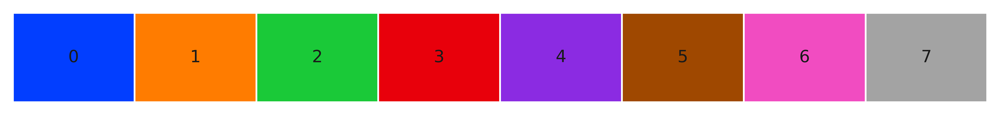

In [121]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)
plt.savefig("PBMC10k_cellType-heatmap-legend-top5.pdf", dpi=600, bbox_inches = "tight")

In [122]:
sns.set(font_scale=1.2)
g = sns.clustermap(auc_mtx_Z[topreg], annot=False,  square=False,  linecolor='gray',
    yticklabels=False, xticklabels=True, vmin=-2, vmax=6, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16) )
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')
plt.savefig("PBMC10k_cellType-heatmap-top5.pdf", dpi=600, bbox_inches = "tight")

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


In [123]:
pip install -U jupyter_server

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 347.5/347.5 kB 6.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 13.5 MB/s eta 0:00:00
  Attempting uninstall: jupyter-core
    Found existing installation: jupyter_core 4.11.2
    Uninstalling jupyter_core-4.11.2:
      Successfully uninstalled jupyter_core-4.11.2
  Attempting uninstall: jupyter_server
    Found existing installation: jupyter-server 1.23.4
    Uninstalling jupyter-server-1.23.4:
      Successfully uninstalled jupyter-server-1.23.4
Note: you may need to restart the kernel to use updated packages.


In [125]:
!pip install -I jinja2==3.0.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 4.2 MB/s eta 0:00:00
